## Analysis notebook for Thompson Sampling of PETase strains

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import arviz
import ipywidgets
from matplotlib import cm, pyplot
import numpy
import os
import pandas
import pathlib
import pickle

try:
    import pymc3
except:
    import pymc as pymc3

import calibr8
import cutisplit
import pyrff
import retl
import robotools
import scipy

import run_analysis

You are running the v4 development version of PyMC which currently still lacks key features. You probably want to use the stable v3 instead which you can either install via conda or find on the v3 GitHub branch: https://github.com/pymc-devs/pymc/tree/v3
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
%load_ext watermark
%watermark --iversions

numpy     : 1.20.3
robotools : 1.1.0
cutisplit : 0.2.0
pyrff     : 2.0.1
arviz     : 0.11.4
scipy     : 1.7.1
pandas    : 1.3.4
retl      : 0.3.1
matplotlib: 3.4.3
ipywidgets: 7.6.5
calibr8   : 6.1.0
pymc      : 4.0.0



,culture_id,assay_well,assay_column,time,value,concentration_factor
BZP1XQ_1_B01,BZP1XQ_A07,B01,1,"[0.0, 1.3613, 2.7222666666666666, 4.0835333333...","[0.3831, 0.39, 0.4006, 0.411, 0.4193, 0.429, 0...",1
BZP1XQ_1_B07,BZP1XQ_A07,B07,7,"[0.0, 1.3613, 2.7222666666666666, 4.0835333333...","[0.4208, 0.4709, 0.433, 0.4685, 0.502, 0.5114,...",1
BZP1XQ_1_B02,BZP1XQ_B07,B02,2,"[0.0, 1.3613, 2.7222666666666666, 4.0835333333...","[0.4622, 0.4787, 0.4932, 0.5087, 0.5246, 0.542...",1
BZP1XQ_1_B08,BZP1XQ_B07,B08,8,"[0.0, 1.3613, 2.7222666666666666, 4.0835333333...","[0.4475, 0.4988, 0.5292, 0.5206, 0.566, 0.5231...",1
BZP1XQ_1_B03,BZP1XQ_C07,B03,3,"[0.0, 1.3613, 2.7222666666666666, 4.0835333333...","[0.4632, 0.5337, 0.5147, 0.5908, 0.5698, 0.598...",1
...,...,...,...,...,...,...
C4PZHQ_2_G10,C4PZHQ_D02,G10,10,"[0.0, 1.3599833333333333, 2.720133333333333, 4...","[0.491, 0.5455, 0.6123, 0.7064, 0.7457, 0.8121...",1
C4PZHQ_2_G05,C4PZHQ_E02,G05,5,"[0.0, 1.3599833333333333, 2.720133333333333, 4...","[0.5234, 0.6289, 0.7102, 0.788, 0.8641, 0.9434...",1
C4PZHQ_2_G11,C4PZHQ_E02,G11,11,"[0.0, 1.3599833333333333, 2.720133333333333, 4...","[0.5108, 0.6275, 0.6864, 0.7667, 0.8537, 0.947...",1
C4PZHQ_2_G06,C4PZHQ_F02,G06,6,"[0.0, 1.3599833333333333, 2.720133333333333, 4...","[0.4803, 0.5493, 0.6499, 0.711, 0.7739, 0.8671...",1


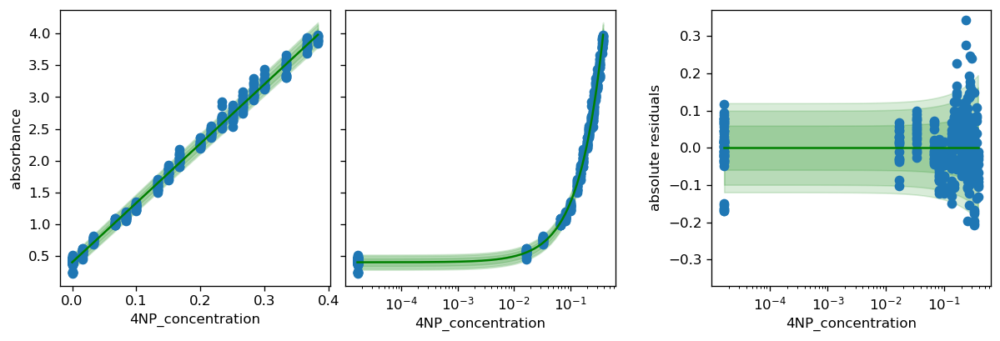

In [29]:
RUN_ID = "C4PZHQ"
resultpath = f'{RUN_ID}_Results' 
cm_nitrophenol = cutisplit.NitrophenolAbsorbanceModel.load(rf"{resultpath}\{RUN_ID}_cm_nitrophenol.json")
calibr8.plot_model(cm_nitrophenol)


df_inputs, df_kinetics = run_analysis.read_rounds(["BZP1XQ", "BWNZ99", "C4PZHQ"])

## Creating the Model

In [30]:
model = cutisplit.LongFormModel(
    df_inputs,
    df_kinetics=df_kinetics,
    cm_nitrophenol=cm_nitrophenol,
)
# the shapes of the dataset are encoded in the "coords" of the underlying PyMC3 model:
model.summary()

strain              (24,)	AbnA, AmyE, AprE, …, YwmC
culture_id          (72,)	BWNZ99_A02, BWNZ99_A04, BWNZ99_A05, …, C4PZHQ_F07
kinetic_id          (288,)	BWNZ99_1_B01, BWNZ99_1_B02, BWNZ99_1_B03, …, C4PZHQ_2_G12
column_id           (12,)	1, 2, 3, …, 12
cutinase_cycle      (30,)	0, 1, 2, …, 29


The PyMC3 model can be visualized as a graph:

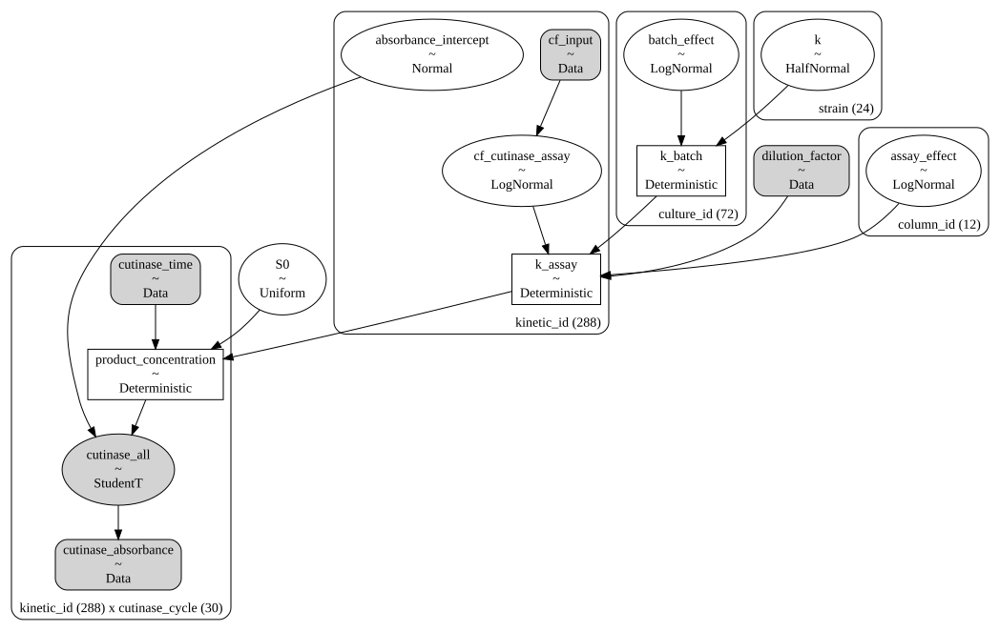

In [31]:
pymc3.model_to_graphviz(model.pmodel)

In [32]:
with model.pmodel:
    idata = pymc3.sample(return_inferencedata=True, target_accept=0.9)
idata

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [cf_cutinase_assay, k, batch_effect, assay_effect, S0, absorbance_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1281 seconds.


Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

The result should be saved such that the analysis can run in another notebook.

In [33]:
idata.to_netcdf(fr"{resultpath}\{RUN_ID}_result_columneffect.nc")

'C4PZHQ_Results\\C4PZHQ_result_columneffect.nc'

Execute the next cell in case you want to reload saved data

In [ ]:
idata = arviz.from_netcdf("BZP1XQ_Results\BZP1XQ_result_hierarchical_greaterSD.nc")

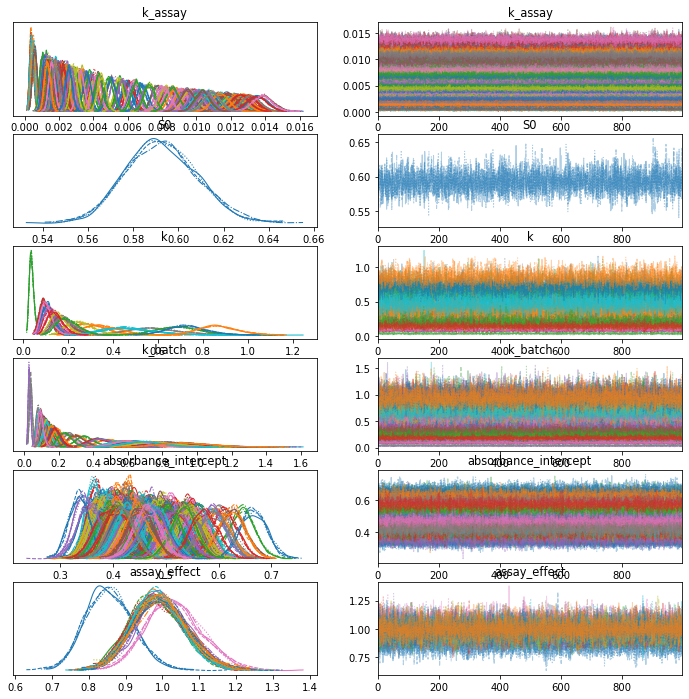

In [45]:
arviz.plot_trace(idata, var_names=[
    "k_assay", "S0", "k", "k_batch", "absorbance_intercept", "assay_effect"
]);
# The left subplots show the posterior probability density.
# The right subplots show the MCMC. If they look like random noise everything is fine.
# The linestyle corresponds to independent MCMC chains - they should come to the same result.

C:\Users\helleckes\AppData\Local\Continuum\miniconda3\envs\dibecs_6.0.1\lib\site-packages\arviz\plots\backends\matplotlib\pairplot.py:238: UserWarning: rcParams['plot.max_subplots'] (144) is smaller than the number of resulting pair plots with these variables, generating only a 16x16 grid
  warnings.warn(


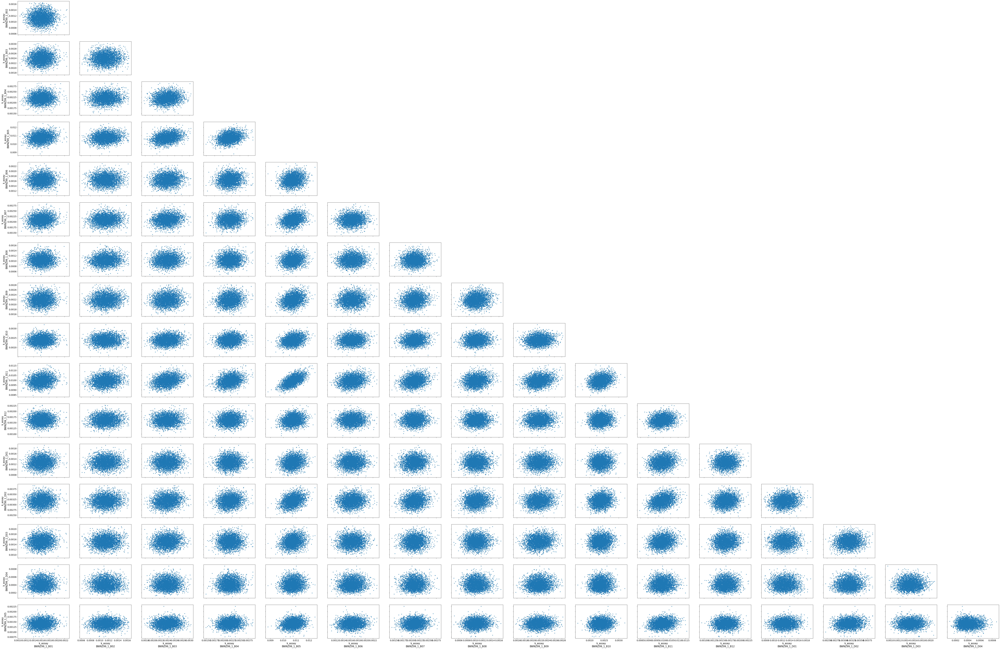

In [35]:
arviz.rcParams['plot.max_subplots'] = 144
arviz.plot_pair(idata, var_names=[
    "k_assay", 
    "k", "k_batch", "S0", 
    "absorbance_intercept"
]);

array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

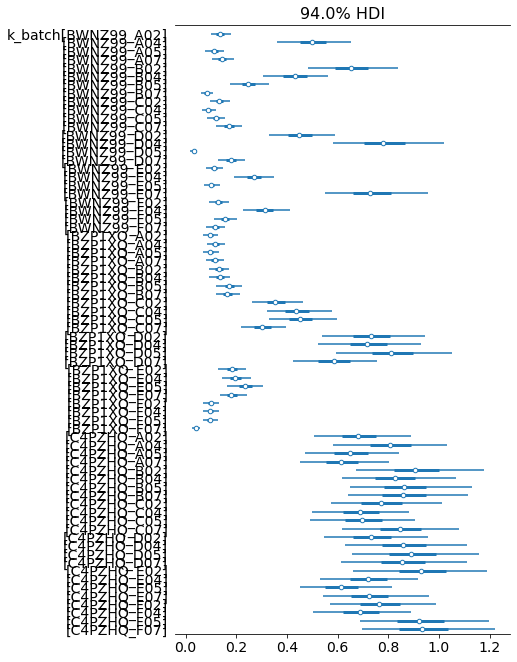

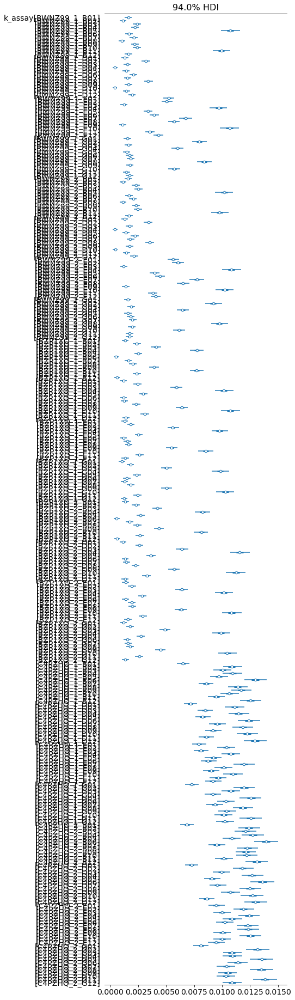

In [36]:
arviz.plot_forest(idata, var_names=["k_batch"], combined=True)
arviz.plot_forest(idata, var_names=["k_assay"], combined=True)

array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

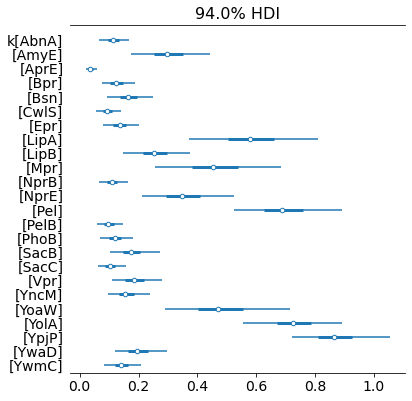

In [37]:
arviz.plot_forest(idata, var_names=["k"], combined=True)

array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

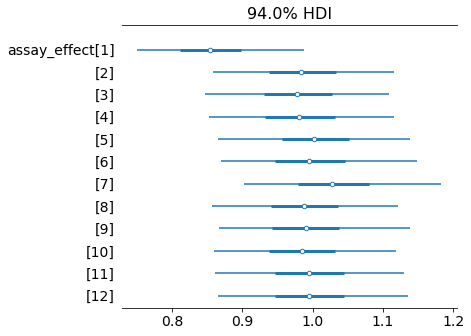

In [46]:
arviz.plot_forest(idata, var_names=["assay_effect"], combined=True)

In [39]:
posterior = idata.posterior.stack(sample=("chain", "draw"))
posterior

<xarray.Dataset>
Dimensions:                (column_id: 12, culture_id: 72, cutinase_cycle: 30, kinetic_id: 288, sample: 4000, strain: 24)
Coordinates:
  * kinetic_id             (kinetic_id) <U12 'BWNZ99_1_B01' ... 'C4PZHQ_2_G12'
  * strain                 (strain) <U4 'AbnA' 'AmyE' 'AprE' ... 'YwaD' 'YwmC'
  * culture_id             (culture_id) <U10 'BWNZ99_A02' ... 'C4PZHQ_F07'
  * column_id              (column_id) int32 1 2 3 4 5 6 7 8 9 10 11 12
  * cutinase_cycle         (cutinase_cycle) int32 0 1 2 3 4 5 ... 25 26 27 28 29
  * sample                 (sample) MultiIndex
  - chain                  (sample) int64 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  - draw                   (sample) int64 0 1 2 3 4 5 ... 995 996 997 998 999
Data variables:
    cf_cutinase_assay      (kinetic_id, sample) float64 0.9226 0.8549 ... 0.9554
    k                      (strain, sample) float64 0.1579 0.1015 ... 0.07304
    batch_effect           (culture_id, sample) float64 1.021 0.9863 ... 1.538
    assay_effect           (column_id, sample) float64 0.8207 0.795 ... 0.9529
    S0                     (sample) float64 0.5327 0.6026 ... 0.6086 0.5834
    absorbance_intercept   (kinetic_id, sample) float64 0.4088 0.3976 ... 0.408
    k_batch                (culture_id, sample) float64 0.1655 0.1434 ... 1.071
    k_assay                (kinetic_id, sample) float64 0.001642 ... 0.01109
    product_concentration  (kinetic_id, cutinase_cycle, sample) float64 0.0 ....
Attributes:
    created_at:                 2021-10-19T15:42:32.031226
    arviz_version:              0.11.4
    inference_library:          pymc
    inference_library_version:  4.0.0
    sampling_time:              1281.0487694740295
    tuning_steps:               1000

In [40]:
strains = numpy.unique(df_inputs.strain.values)
numpy.random.seed(27092021)
selected_strains = pyrff.sample_batch(
    posterior.k.values,
    ids=strains,
    batch_size=12,
    correlated=True
)
numpy.unique(selected_strains, return_counts=True)

(array(['Pel', 'YpjP'], dtype='<U4'), array([ 1, 11], dtype=int64))

In [41]:
selected_strains_shuffled = numpy.copy(selected_strains)
numpy.random.shuffle(selected_strains_shuffled)
wells = [f"{l}{n:02d}" for n in [1,8] for l in "ABCDEF" ]
inoculation_dict = {
    well: strain 
    for well, strain in zip(wells, selected_strains_shuffled)
}
inoculation_dict

{'A01': 'YpjP',
 'B01': 'YpjP',
 'C01': 'YpjP',
 'D01': 'YpjP',
 'E01': 'YpjP',
 'F01': 'YpjP',
 'A08': 'YpjP',
 'B08': 'YpjP',
 'C08': 'Pel',
 'D08': 'YpjP',
 'E08': 'YpjP',
 'F08': 'YpjP'}

In [42]:
probs = pyrff.sampling_probabilities(
    posterior.k.values,
    correlated=True
)

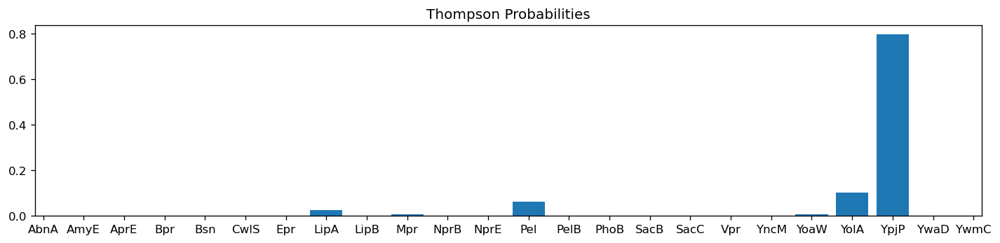

In [43]:
fig, ax = pyplot.subplots(figsize=(12,3), dpi=120)
ax.bar(x=numpy.arange(len(probs)), height=probs,)
ax.set(
    xticks=numpy.arange(len(probs)), 
    xticklabels=numpy.unique(df_inputs.strain.values),
    xlim=(-0.2,23.2),
)
ax.set_title("Thompson Probabilities")
pyplot.tight_layout()

C:\Users\helleckes\AppData\Local\Continuum\miniconda3\envs\dibecs_6.0.1\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


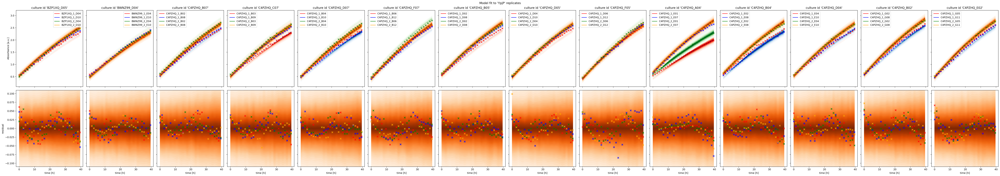

In [44]:
#for strain in posterior.strains.values:
strain="YpjP"
culture_ids = df_inputs[df_inputs.strain==strain].index.to_list()
fig, axs = pyplot.subplots(
        dpi=140,
        figsize=( 4*len(culture_ids), 10),
        ncols=len(culture_ids),
        nrows=2,
        sharey="row",
        sharex="col",
        squeeze=False,
    )
for c, cid in enumerate(culture_ids):
    df = df_kinetics[df_kinetics.culture_id==cid]
    kinetic_ids = df.index
    residual_ptp = 0
    for r, (kid, (color, cmap)) in enumerate(zip(kinetic_ids, [
        ("red", "Reds"),
        ("blue", "Blues"),
        ("green", "Greens"),
        ("orange", "Oranges"),
    ])):


        # and the actual absorbance
        absorbance = idata.constant_data.cutinase_absorbance.sel(kinetic_id=kid)
        #print(color, kid, cid)
        
        axs[0,c].scatter(
            idata.constant_data.cutinase_time.values[0,:],
            absorbance,
            marker="x",
            color=color,
            zorder=10
        )
        theta = [
            posterior.absorbance_intercept.sel(kinetic_id=kid).values
        ] + list(cm_nitrophenol.theta_fitted[1:])
        loc, scale, df = cm_nitrophenol.predict_dependent(
            posterior.product_concentration.sel(kinetic_id=kid).values,
            theta=theta
            
        )
        pp_samples = scipy.stats.t.rvs(loc=loc, scale=scale, df=df)

        pymc3.gp.util.plot_gp_dist(
            ax=axs[0,c],
            samples=pp_samples.T,
            x=idata.constant_data.cutinase_time.values[0,:],
            palette=cmap,
            plot_samples=False,
        )
        
        #residuals
        median = numpy.median(pp_samples, axis=1)
        residuals = absorbance.values - median
        residual_ptp = max(residual_ptp, numpy.ptp(residuals))

        pymc3.gp.util.plot_gp_dist(
            ax=axs[1, c],
            samples=(pp_samples - median[:,None]).T,
            x=idata.constant_data.cutinase_time.values[0,:],
            plot_samples=False,
            palette=cmap
        )
        axs[1, c].scatter(
            idata.constant_data.cutinase_time.values[0,:], residuals, marker="x", color=color, zorder=10
        )
        axs[0, c].plot([], [], color=color, label=kid)
    # formatting
    axs[0, c].set_title(f"culture id '{cid}'")
    axs[1, c].set_xlabel("time [h]") 
    axs[0, c].legend()

axs[0, 0].set_ylabel(
    "Absorbance [a.u.]"
)
axs[1, 0].set_ylim(-residual_ptp, residual_ptp)
axs[1, 0].set_ylabel("residual ")
fig.suptitle(
    f"Model fit to '{strain}' replicates"
)
fig.tight_layout()